# Introduction to ROM methods: SVD based techniques

This notebook presents the basis concepts of Reduced Order Modelling (ROM), starting from the most basic techniques based on the Singular Value Decomposition (SVD) for matrices. This notebook will also present the import class from OpenFOAM simulation, implemented within the *pyforce* package.

In this tutorial, you will learn:

- How to import snapshots from OpenFOAM simulations through the `ReadFromOF` class;
- How to compress fluid dynamics fields (pressure and velocity) using randomised SVD and the Proper Orthogonal Decomposition (POD) technique.
- How to create a simple surrogate model for the reduced dynamics using interpolation and regression techniques.

The data for this tutorial comes from an OpenFOAM tutorial (com version 2012) for *pimpleFoam* in laminar condition, called [`cylinder2D`](https://gitlab.com/openfoam/openfoam/-/tree/maintenance-v2012/tutorials/incompressible/pimpleFoam/laminar/cylinder2D?ref_type=heads).

## Read OpenFOAM cases
The *pyforce* package comes with the `ReadFromOF` class, which allows users to easily import simulation data from OpenFOAM cases. This class must be initialized with the path to the OpenFOAM case folder.

In [1]:
from pyforce.tools.write_read import ReadFromOF
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

io_data = ReadFromOF('Datasets/LaminarFlowCyl_OF2012/', 
                    skip_zero_time=True # optional
                    )

The variables to import are the pressure (scalar field) and the velocity (vector field). The snapshots can be loaded using `pyvista` (default) or `fluidfoam` libraries: the latter is more efficient for large datasets, but it only supports cell data. The method `import_field` can be used to load the data from the OpenFOAM case and returns the snapshots as a `FunctionsList` object, including a vector with the time instances (from the OpenFOAM directories).

In [2]:
import numpy as np

var_names = ['p', 'U']

dataset = dict()

for field in var_names:

    print('Importing '+field+f' using pyvista')
    dataset[field], times = io_data.import_field(field,
                                              use_fluidfoam=False, verbose=False # optional
                                              )

Importing p using pyvista
Importing U using pyvista


Let us also extract the grid needed by *pyforce* using the `mesh` method, to make a plot of the snapshots

In [3]:
grid = io_data.mesh()
grid

UnstructuredGrid,Information
N Cells,34764
N Points,70396
X Bounds,"-6.075e-01, 1.120e+00"
Y Bounds,"-6.000e-01, 6.000e-01"
Z Bounds,"-7.500e-03, 7.500e-03"
N Arrays,0


In addition to these fields, let us add also the vorticity field, defined as the curl of the velocity field, $\boldsymbol{\omega} = \nabla \times \mathbf{u}$.

In [4]:
from pyforce.tools.backends import LoopProgress
from pyforce.tools.functions_list import FunctionsList

var_names.append('vorticity')
mesh = io_data.mesh

dataset['vorticity'] = FunctionsList(dofs = dataset['U'].fun_shape)
bar = LoopProgress(final=len(times), msg='Computing vorticity field')
for ii, t in enumerate(times):

    grid['U'] = dataset['U'][ii].reshape(-1, 3)

    dataset['vorticity'].append( 
                        grid.compute_derivative(scalars='U',
                                                vorticity=True)['vorticity'].flatten()                    
                    )
    
    bar.update(1)


Computing vorticity field: 250.000 / 250.00 - 0.013324 s/it


Let us make a plot of the snapshots

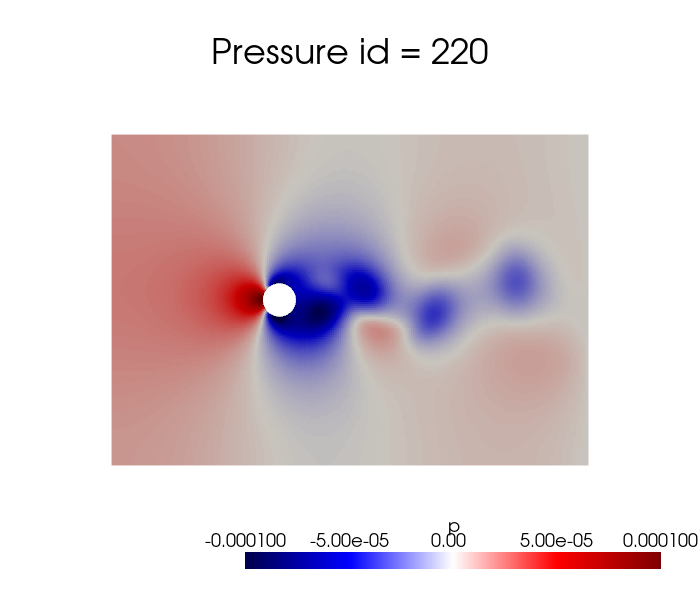

In [5]:
dataset['p'].plot_sequence(grid, sampling = 20, title='Pressure id = ', title_size=15, resolution=[700,600], cmap='seismic', clim=[-1e-4, 1e-4], varname='p')

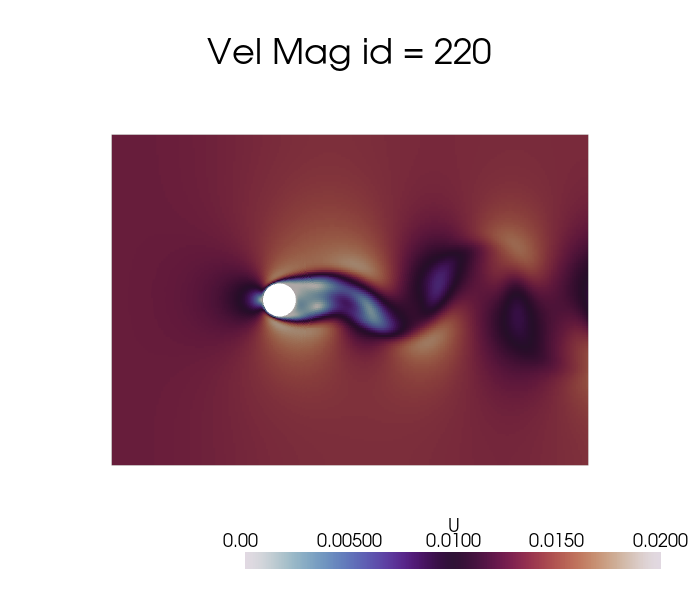

In [7]:
dataset['U'].plot_sequence(grid, sampling = 20, title='Vel Mag id = ', title_size=15, resolution=[700,600], cmap='twilight', clim=[0, 0.02], varname='U')

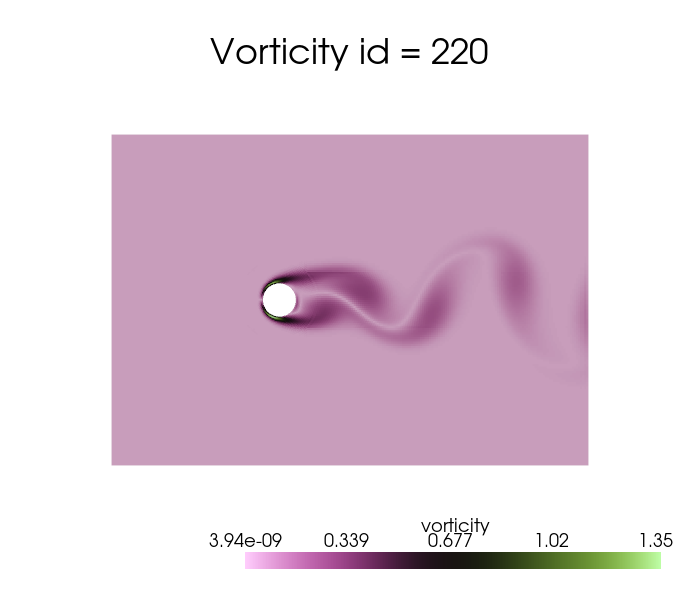

In [8]:
dataset['vorticity'].plot_sequence(grid, sampling = 20, title='Vorticity id = ', title_size=15, resolution=[700,600], cmap='vanimo', varname='vorticity')

## Offline Phase
Every ROM technique is divided into an offline-online paradigm: the former is responsible for the construction of the basis functions and the subsequent data compression, while the latter is responsible for the evaluation of the reduced model at unseen parameters.

The offline phase is the most computationally expensive, as it includes the generation of the snapshots (e.g., by solving the high-fidelity/full-order model) and the construction of the reduced basis, on the other hand the online phase is designed to be very fast, allowing for real-time evaluations of the reduced model. The *pyforce* package concentrates on linear dimensionality reduction techniques, which are based on the assumption that the solution manifold can be well approximated by a linear subspace of lower dimension and the basic principle of separation of variables.

Considering the solution manifold $\mathcal{U}$ of a given parametric PDE and let $u(\mathbf{x},\mu)$ be an element of this space. The basis functions $\{\phi_i(\mathbf{x})\}_{i=1}^{N}$ span a linear subspace $X_N\subset\mathcal{U}$, where $N$ is the number of basis functions. The approximation of the solution $u(\mathbf{x},\mu)$ in the reduced space is given by:

$$
u(\mathbf{x},\mu) \approx \sum_{i=1}^{N} \alpha_i(\mu) \phi_i(\mathbf{x})
$$

where $\alpha_i(\mu)$ are the coefficients that depend on the parameter $\mu$ (including time). The basis functions are constructed to embed the most dominant spatial features of the training snapshots and hopefully of the solution manifold. The important thing to stress is that these reduced basis functions are fixed from the offline phase, while the coefficients $\alpha_i(\mu)$ are computed in the online phase for new parameter values. Adopting this kind of approach, it is sufficient to estimate the state of the system by computing only the coefficients $\alpha_i(\mu)$, which are much fewer than the original degrees of freedom of the full-order model; hence, the problem shifts in generating a suitable model for the reduced coefficients, sometimes also called *latent space/dynamics*.

Before delving into the different techniques, let us split the data into train and test.

In [9]:
from pyforce.tools.functions_list import train_test_split

train_datasets = dict()
test_datasets  = dict()

for field in var_names:
    train_times, test_times, train_datasets[field], test_datasets[field] = train_test_split(times, dataset[field], test_size=0.2, random_state=42)

    # Since time is better to have it sorted in ascending order, let us sort them and the associated datasets
    train_sorting_indices = np.argsort(train_times)
    test_sorting_indices  = np.argsort(test_times)

    train_times = np.array(train_times)[train_sorting_indices]
    test_times  = np.array(test_times)[test_sorting_indices]

    train_datasets[field].sort(train_sorting_indices)
    test_datasets[field].sort(test_sorting_indices)

In this notebook, the focus will be on the Singular Value Decomposition (SVD) and the Proper Orthogonal Decomposition (POD) techniques for the construction of the reduced basis.

### Singular Value Decomposition (SVD)
The Singular Value Decomposition (SVD) is a mathematical technique used to decompose a matrix into three other matrices, let $\mathbb{S}\in\mathbb{R}^{\mathcal{N}_h\times N_s}$ be a matrix (in our context containing spatial-temporal snapshots, also parametric if considered), the SVD of $\mathbb{S}$ is given by:

$$
\mathbb{S} = \mathbb{U} \Sigma \mathbb{V}^T
$$

where $\mathbb{U}\in\mathbb{R}^{\mathcal{N}_h\times \mathcal{N}_h}$ is a matrix whose columns are the left singular vectors, $\Sigma\in\mathbb{R}^{\mathcal{N}_h\times N_s}$ is a diagonal matrix containing the singular values, and $\mathbb{V}\in\mathbb{R}^{N_s\times N_s}$ is a matrix whose columns are the right singular vectors. The singular values in $\Sigma$ are non-negative and typically arranged in descending order. The first matrix $\mathbb{U}$ represents the spatial modes, while the second matrix $\mathbb{V}$ represents the temporal modes (or parametric modes if parameters are considered), the diagonal entries of $\Sigma$ indicate the importance of each mode.

The *pyforce* package implements a randomised version of the SVD (rSVD), which is more efficient for large datasets. 

The initialisation of the class requires a `pv.UnstructuredGrid` object, optionally the variable of the field to compress and the dimension of the problem (2D or 3D).

In [10]:
from pyforce.offline.pod import rSVD

rsvd = dict()

for field in var_names:
    rsvd[field] = rSVD(grid, 
                       varname=field # optional
                       )

Then, the method `fit` can be used to compute the modes and the singular values, providing the training snapshots as a `FunctionsList` object and the rank of the decomposition (number of modes to compute). Optionally, the `verbose` flag can be set to `True` to print information about the computational times.

In [11]:
max_rank = 100

for field in var_names:
    rsvd[field].fit(train_datasets[field], rank=max_rank,
                    verbose=True # optional
                    )

SVD of p snapshots calculated in 0.225078 seconds (cpu).
SVD of U snapshots calculated in 0.673486 seconds (cpu).
SVD of vorticity snapshots calculated in 0.665152 seconds (cpu).


The class is provided with a method to plot the singular values, which can be used to assess the quality of the decomposition and to choose the number of modes to retain for the reduced basis.

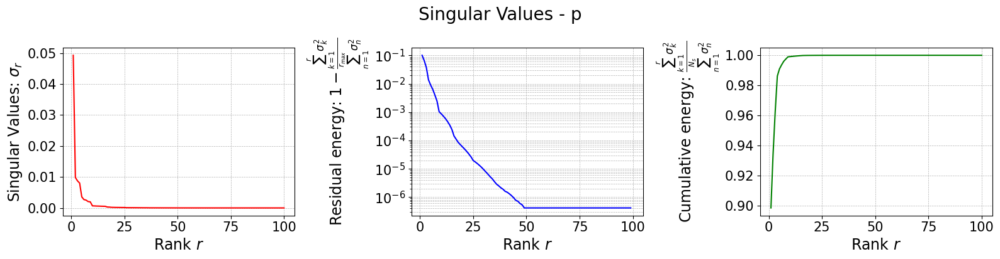

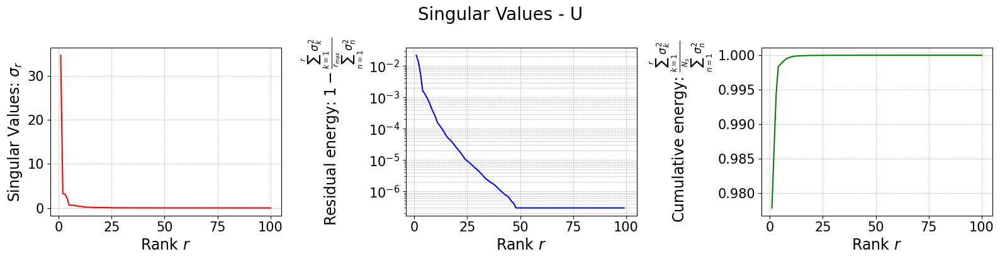

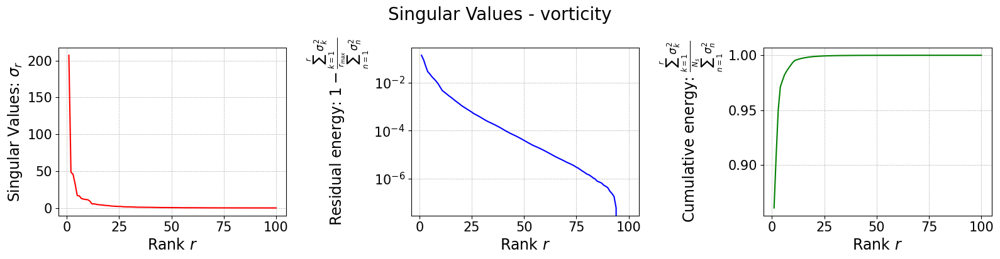

In [12]:
for field in var_names:
    rsvd[field].plot_sing_vals()

Let us now plot the spatial modes to observe what they look like using `matplotlib` (alternately, we can exploit the `plot` method of the `FunctionsList` class for the SVD modes), but we will stick to `matplotlib` for now to have a visualiation using subplots and show another way to plot the modes.

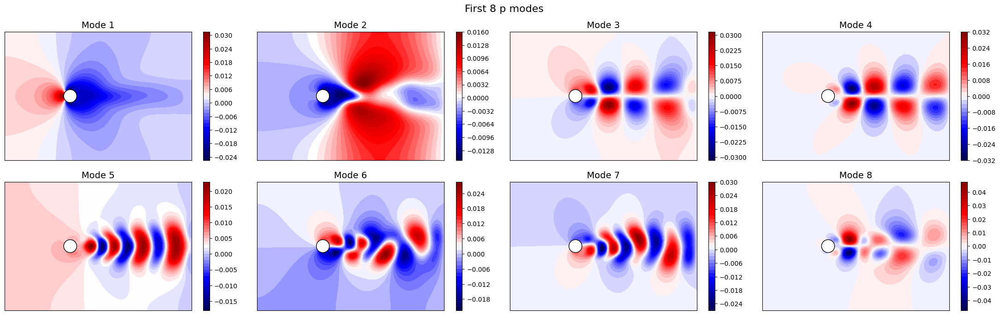

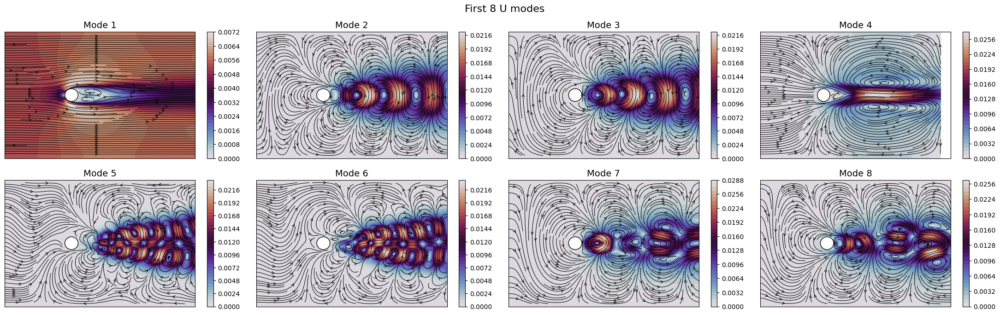

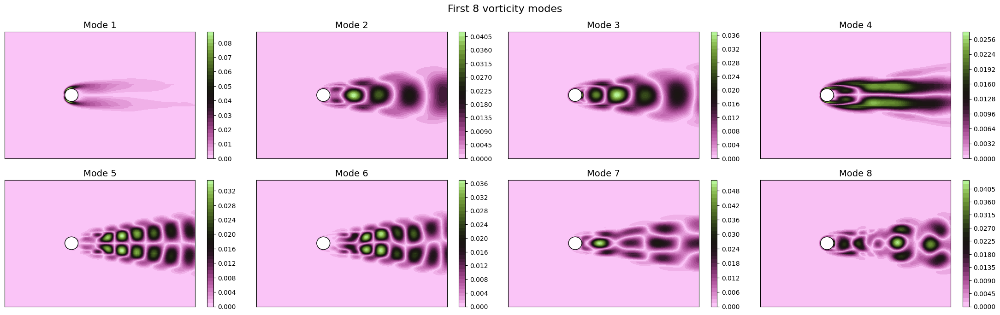

In [13]:
from matplotlib import patches, cm, pyplot as plt
from scipy.interpolate import griddata

class PlotFlowCyl:
    def __init__(self, grid, center = (0,0), radius = 0.05, gdim=3):
        self.nodes = grid.cell_centers().points

        self.width = np.max(self.nodes[:,0]) - np.min(self.nodes[:,0])
        self.height = np.max(self.nodes[:,1]) - np.min(self.nodes[:,1])
        self.aspect = self.height / self.width

        self.center = center
        self.radius = radius
        self.gdim = gdim

    def create_streamlines(self, velocity):

        x_grid = np.linspace(self.nodes[:,0].min(), self.nodes[:,0].max(), 50)
        y_grid = np.linspace(self.nodes[:,1].min(), self.nodes[:,1].max(), 50)
        X, Y = np.meshgrid(x_grid, y_grid)

        U_interp = griddata(self.nodes[:, :2], velocity[:,0], (X, Y), method='linear')
        V_interp = griddata(self.nodes[:, :2], velocity[:,1], (X, Y), method='linear')

        # Mask inside the circle
        mask = (X - self.center[0])**2 + (Y - self.center[1])**2 <= self.radius**2
        U_interp[mask] = np.nan
        V_interp[mask] = np.nan

        return X, Y, U_interp, V_interp

    def create_circle(self, ls=1):
        circle = patches.Circle(self.center, self.radius, edgecolor='black', facecolor='white', linewidth=ls)
        return circle
    
    def plot_contour(self, ax, snap, cmap = cm.RdYlBu_r, levels=40, show_ticks=False,
                     streamline_plot = False, density = 2, linewidth=0.75):

        if snap.shape[0] == self.gdim*self.nodes.shape[0]:
            _vec = snap.reshape(-1, self.gdim)
            snap = np.linalg.norm(_vec, axis=1)
            
        plot = ax.tricontourf(self.nodes[:,0], self.nodes[:,1], snap, cmap=cmap, levels=levels)
        ax.add_patch(self.create_circle())
        
        if not show_ticks:
            ax.set_xticks([])
            ax.set_yticks([])

        if streamline_plot:
            ax.streamplot(*self.create_streamlines(_vec), 
                           color='k', density=density, linewidth=linewidth, arrowstyle='->')

        return plot

plotter = PlotFlowCyl(grid, radius=0.06)

nrows = 2
ncols = 4

cmaps = {
    'p': cm.seismic,
    'U': cm.twilight,
    'vorticity': cm.vanimo
}

for field in var_names:

    fig, axs = plt.subplots(nrows, ncols, figsize=(5.5 * ncols, 5 * nrows * plotter.aspect))
    axs = axs.flatten()

    for ii in range(len(axs)):
        c = plotter.plot_contour(axs[ii], rsvd[field].svd_modes(ii), cmap=cmaps[field], streamline_plot=True if field=='U' else False)
        fig.colorbar(c, ax=axs[ii])
        axs[ii].set_title(f'Mode {ii+1}', fontsize=14)

    fig.suptitle(f'First {nrows * ncols} {field} modes', fontsize=16)
    plt.tight_layout()

The SVD identifies the most energetic modes in the data, in the form of **coherent structures**. For instance, the first mode identifies the mean flow, while the second and third ones identify the vortex shedding in the dominant frequencies. The SVD allows to decompose the flow field following the energy decay of turbulence associated to the importance of the mode (measured by the singular value).

The modes describes the spatial structures, while the temporal coefficients (also called *latent space*) describe how these structures evolve in time. The temporal coefficients can be obtained by projecting the snapshots onto the spatial modes.These coefficients can be computed using the `reduce` method.

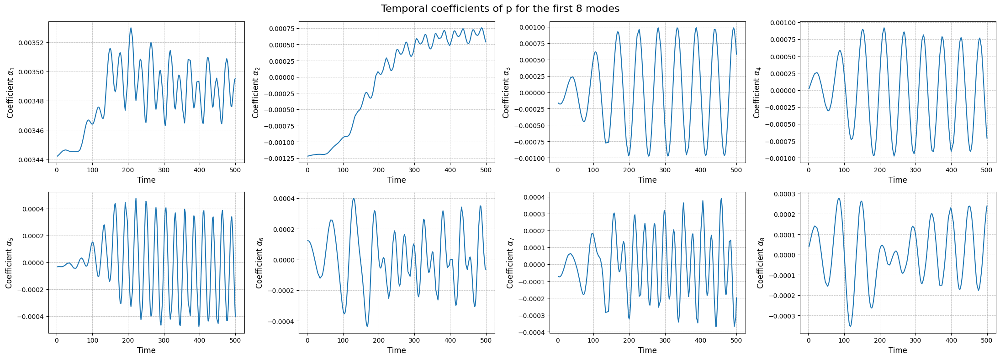

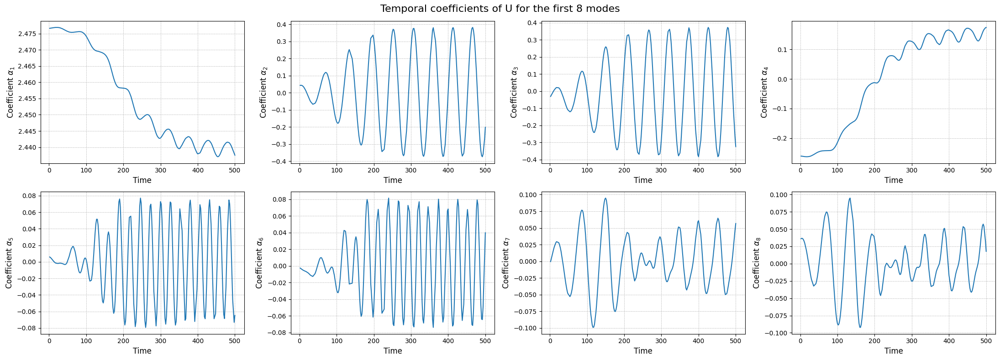

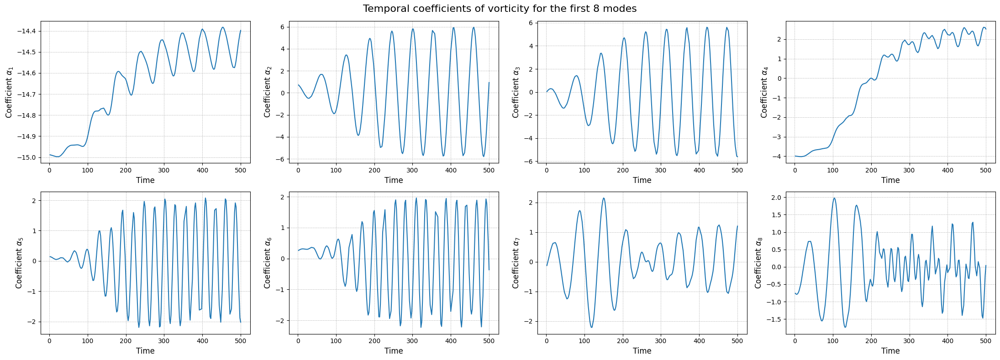

In [14]:
rsvd_coeffs = dict()

for field in var_names:
    rsvd_coeffs[field] = rsvd[field].reduce(train_datasets[field], N=max_rank)

    fig, axs = plt.subplots(nrows, ncols, figsize=(5.5 * ncols, 4 * nrows))
    axs = axs.flatten()

    for ii in range(len(axs)):
        axs[ii].plot(train_times, rsvd_coeffs[field][ii], label=field)
        axs[ii].set_xlabel('Time', fontsize=12)
        axs[ii].set_ylabel(r'Coefficient $\alpha_{' + str(ii+1) + '}$', fontsize=12)
        axs[ii].grid(which='both', linestyle='--', linewidth=0.5)

    fig.suptitle(f'Temporal coefficients of {field} for the first {nrows * ncols} modes', fontsize=16)
    plt.tight_layout()

The class also provides a method to store the results of the decomposition: the modes and the singular values. The method `save` can be used to save the results in a specified folder, exploiting the method `store` of `FunctionsList`.

In [15]:
import os
path_res = 'Results/01/OfflineSVD/'
os.makedirs(path_res, exist_ok=True)

for field in var_names:
    rsvd[field].save(path_res)

### Proper Orthogonal Decomposition (POD)
The Proper Orthogonal Decomposition (POD) is a technique similar to the SVD, that was designed specifically for fluid dynamics. As the SVD, the POD decomposes a set of snapshots into orthogonal modes and corresponding coefficients, but it does so by solving an eigenvalue problem derived from the covariance matrix of the snapshots.

The SVD is designed for discretised fields in the form of snapshot matrix, while the POD can be extended to continuous functional spaces. In the *pyforce* package, the covariance matrix is computed with respect to the $L^2$ inner product.
Let $\{u_i(\mathbf{x})\}_{i=1}^{N_s}$ be the set of snapshots, the covariance matrix $\mathbb{C}\in\mathbb{R}^{N_s\times N_s}$ is defined as:

$$
\mathbb{C}_{ij} = \left( u_i, u_j \right)_{L^2} = \int_{\Omega} u_i(\mathbf{x})\cdot u_j(\mathbf{x}) d\mathbf{x} \quad i,j = 1, \dots, N_s
$$

The eigendecomposition of the correlation matrix $\mathbb{C}$ is performed, given $\boldsymbol{\eta}_m$ be the eigenvector and $\lambda_m$ the associated eigenvalue
\begin{equation*}
\mathbb{C} \boldsymbol{\eta}_m = \lambda_m \boldsymbol{\eta}_m\qquad m = 1, \dots, N_s
\end{equation*}

This algorithm is implement in *pyforce* within the `POD` class. The initialisation of the class requires a `pv.UnstructuredGrid` object, optionally the variable of the field to compress and the dimension of the problem (2D or 3D) and the verbose flag.

In [16]:
from pyforce.offline.pod import POD

pod = dict()
for field in var_names:
    pod[field] = POD(grid, 
                     varname=field # optional
                     )

Similar to the SVD, the method `fit` can be used to compute the modes and the singular values, providing the training snapshots as a `FunctionsList` object and the rank of the decomposition (number of modes to compute). Optionally, the `verbose` flag can be set to `True` to print information about the computational times.

In [17]:
for field in var_names:
    pod[field].fit(train_datasets[field], 
                    verbose=True # optional
                    )

Computing p correlation matrix: 200.000 / 200.00 - 0.004850 s/it
Eigenvalues calculated in 0.986307 seconds.
Computing U correlation matrix: 200.000 / 200.00 - 0.022668 s/it
Eigenvalues calculated in 4.555967 seconds.
Computing vorticity correlation matrix: 200.000 / 200.00 - 0.022641 s/it
Eigenvalues calculated in 4.552274 seconds.


The class is provided with a method to plot the singular values, which can be used to assess the quality of the decomposition and to choose the number of modes to retain for the reduced basis.

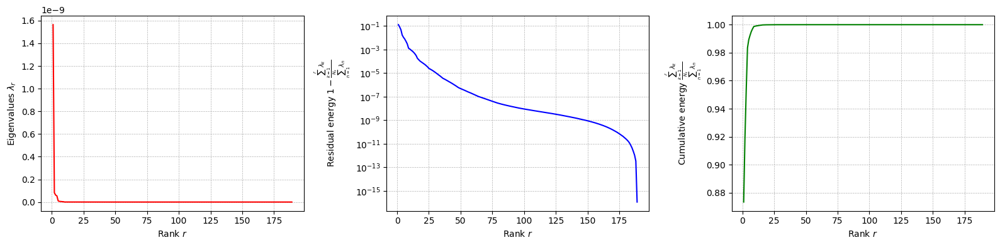

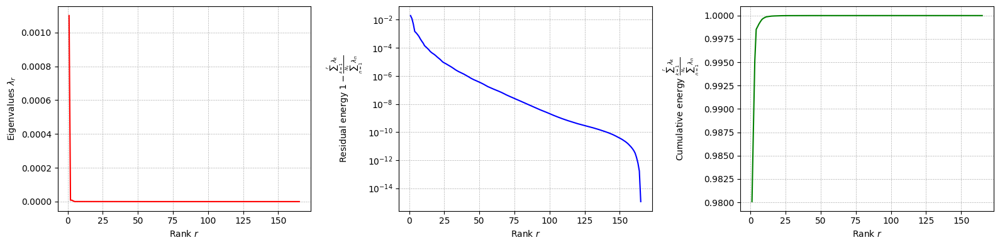

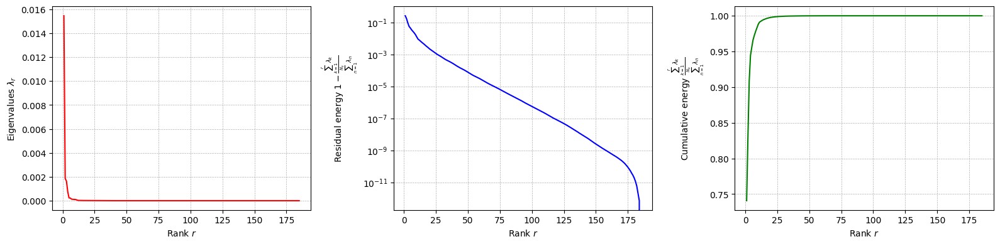

In [18]:
for field in var_names:
    pod[field].plot_eigenvalues()

The difference between SVD and POD, in this case, is given by the inner product used to compute the covariance matrix: it can be proved that if the Euclidean inner product is used, the POD and SVD are equivalent. However, the POD can be extended to other inner products.

Let us compute the POD modes: the basis functions $\psi_m$ (POD modes) are computed through the following
\begin{equation*}
\psi_m(\mathbf{x}) = \frac{1}{\sqrt{\lambda_m}}\sum_{n=1}^{N_s} \eta_{m,n}\cdot u_n(\mathbf{x})
\end{equation*}

In [19]:
for field in var_names:
    pod[field].compute_basis(train_datasets[field], rank=max_rank)

Let us now plot the spatial modes to observe what they look like using `matplotlib` (alternately, we can exploit the `plot` method of the `FunctionsList` class for the SVD modes), but we will stick to `matplotlib` for now to have a visualiation using subplots and show another way to plot the modes.

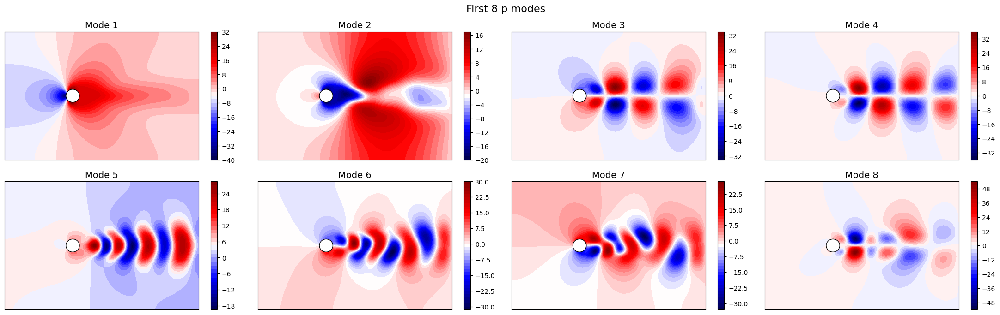

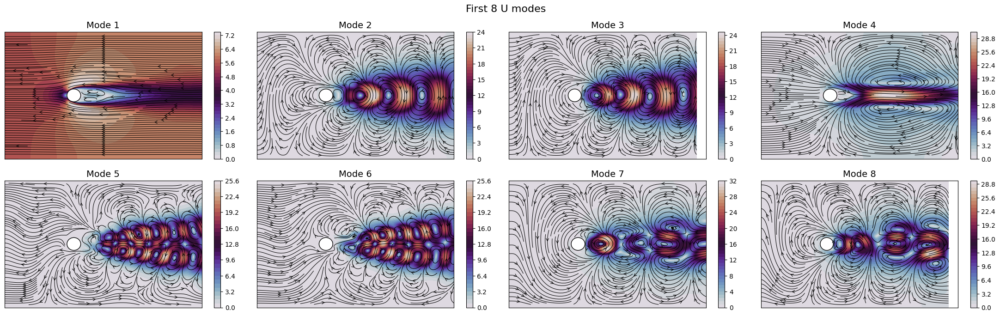

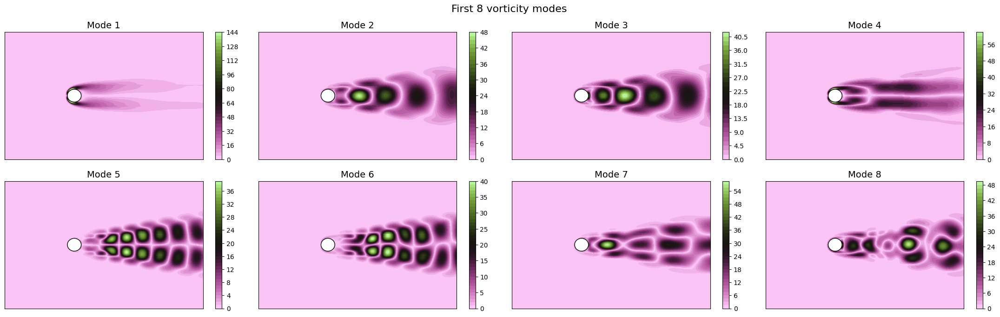

In [20]:
nrows = 2
ncols = 4

for field in var_names:

    fig, axs = plt.subplots(nrows, ncols, figsize=(5.5 * ncols, 5 * nrows * plotter.aspect))
    axs = axs.flatten()

    for ii in range(len(axs)):
        c = plotter.plot_contour(axs[ii], pod[field].pod_modes(ii), cmap=cmaps[field], streamline_plot=True if field=='U' else False)
        fig.colorbar(c, ax=axs[ii])
        axs[ii].set_title(f'Mode {ii+1}', fontsize=14)

    fig.suptitle(f'First {nrows * ncols} {field} modes', fontsize=16)
    plt.tight_layout()

Apart from the different scales, the modes are very similar to the SVD ones, as expected. Let us now observe the reduced coefficients (latent space) associated to the POD modes, which can be computed using the `reduce` method.

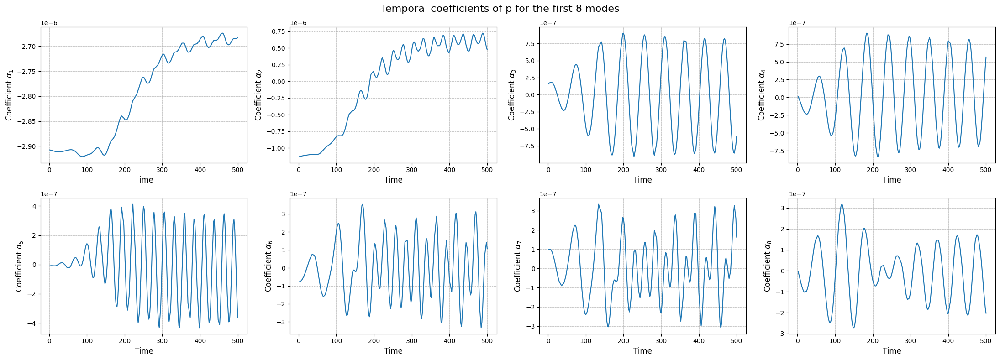

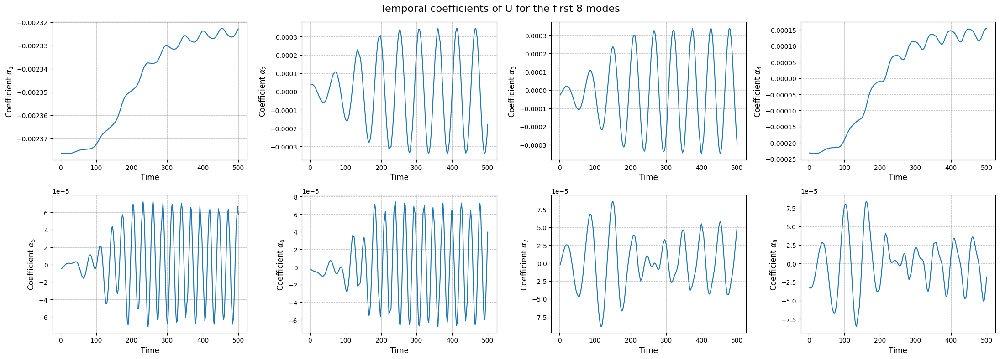

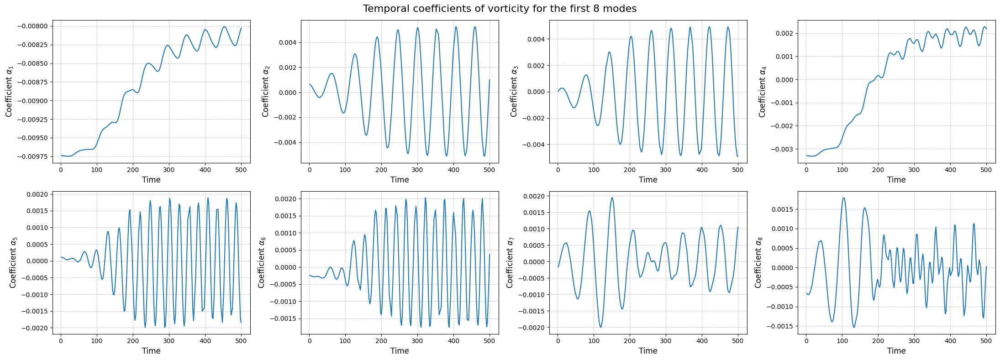

In [21]:
pod_coeffs = dict()

for field in var_names:
    pod_coeffs[field] = pod[field].reduce(train_datasets[field], N=max_rank)

    fig, axs = plt.subplots(nrows, ncols, figsize=(5.5 * ncols, 4 * nrows))
    axs = axs.flatten()

    for ii in range(len(axs)):
        axs[ii].plot(train_times, pod_coeffs[field][ii], label=field)
        axs[ii].set_xlabel('Time', fontsize=12)
        axs[ii].set_ylabel(r'Coefficient $\alpha_{' + str(ii+1) + '}$', fontsize=12)
        axs[ii].grid(which='both', linestyle='--', linewidth=0.5)

    fig.suptitle(f'Temporal coefficients of {field} for the first {nrows * ncols} modes', fontsize=16)
    plt.tight_layout()

Similar to the SVD, the class also provides a method to store the results of the decomposition: the modes and the eigenvalues. The method `save` can be used to save the results in a specified folder, exploiting the method `store` of `FunctionsList`.

In [22]:
import os
path_res = 'Results/01/OfflinePOD/'
os.makedirs(path_res, exist_ok=True)

for field in var_names:
    pod[field].save(path_res)

### Comparison of the projection error for the test set
Let us now compare the projection error of the two techniques on the test set, by projecting the snapshots onto the reduced basis and computing the relative error with respect to the original snapshots adopting as metrics the absolute and relative $L^2$ norm.

This can be done using the `compute_errors` method of the `POD` and `rSVD` classes, which returns a `NamedTuple` containing the absolute and relative errors for each field and the computational costs.

In [23]:
projection_res = {
    'SVD': dict(),
    'POD': dict()
}

max_test_rank = 40

for field in var_names:
    projection_res['SVD'][field] = rsvd[field].compute_errors(test_datasets[field], Nmax = max_test_rank, verbose=True)
    projection_res['POD'][field] = pod[field].compute_errors( test_datasets[field], Nmax = max_test_rank, verbose=True)

Computing errors (SVD-projection) - p: 40.000 / 40.00 - 0.179587 s/it
Computing errors (POD-projection) - p: 40.000 / 40.00 - 0.057290 s/it
Computing errors (SVD-projection) - U: 40.000 / 40.00 - 0.782281 s/it
Computing errors (POD-projection) - U: 40.000 / 40.00 - 0.285877 s/it
Computing errors (SVD-projection) - vorticity: 40.000 / 40.00 - 0.748365 s/it
Computing errors (POD-projection) - vorticity: 40.000 / 40.00 - 0.286050 s/it


Let us make a plot of the errors and the computational times.

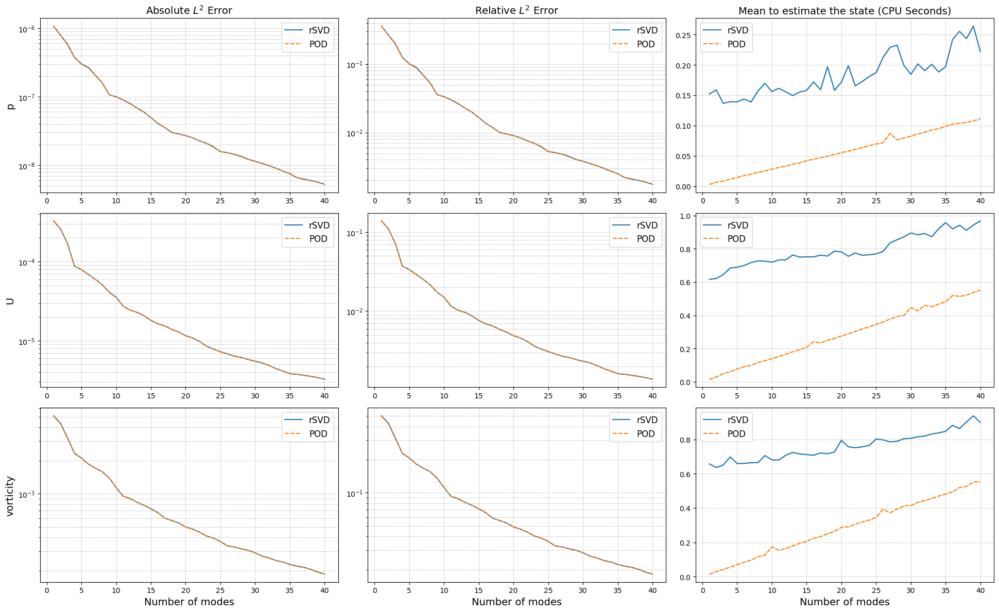

In [24]:
fig, axs = plt.subplots(len(var_names), 3, figsize=(6.5 * 3, 4 * len(var_names)))

N_plot = np.arange(1, max_test_rank + 1)

for ii, field in enumerate(var_names):
    axs[ii,0].semilogy(N_plot, projection_res['SVD'][field][0], '-', label='rSVD', color='C0')
    axs[ii,0].semilogy(N_plot, projection_res['POD'][field][0], '--', label='POD', color='C1')

    axs[ii,1].semilogy(N_plot, projection_res['SVD'][field][1], '-', label='rSVD', color='C0')
    axs[ii,1].semilogy(N_plot, projection_res['POD'][field][1], '--', label='POD', color='C1')

    axs[ii,2].plot(N_plot, projection_res['SVD'][field][2]['StateEstimation'].mean(axis=0), '-', label='rSVD', color='C0')
    axs[ii,2].plot(N_plot, projection_res['POD'][field][2]['StateEstimation'].mean(axis=0), '--', label='POD', color='C1')
    axs[ii,2].fill_between(N_plot, 
                          projection_res['SVD'][field][2]['StateEstimation'].mean(axis=0) - 1.96 * projection_res['SVD'][field][2]['StateEstimation'].std(axis=0),
                          projection_res['SVD'][field][2]['StateEstimation'].mean(axis=0) + 1.96 * projection_res['SVD'][field][2]['StateEstimation'].std(axis=0),
                          color='C0', alpha=0.3)
    axs[ii,2].fill_between(N_plot, 
                          projection_res['POD'][field][2]['StateEstimation'].mean(axis=0) - 1.96 * projection_res['POD'][field][2]['StateEstimation'].std(axis=0),
                          projection_res['POD'][field][2]['StateEstimation'].mean(axis=0) + 1.96 * projection_res['POD'][field][2]['StateEstimation'].std(axis=0),
                          color='C1', alpha=0.3)

axs[0, 0].set_title('Absolute $L^2$ Error', fontsize=14)
axs[0, 1].set_title('Relative $L^2$ Error', fontsize=14)
axs[0, 2].set_title('Mean to estimate the state (CPU Seconds)', fontsize=14)

for ii in range(len(var_names)):
    axs[ii,0].set_ylabel(f'{var_names[ii]}', fontsize=14)

for ax in axs[-1]:
    ax.set_xlabel('Number of modes', fontsize=14)

for ax in axs.flatten():
    ax.legend(fontsize=12)
    ax.grid(which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()

The projection errors are almost identical, while the computational times to estimate the coefficients change significantly: the SVD requires a matrix-vector product with the full-order model, while the POD involves a calculation of integrals which is more optimised in this case.

### Training the interpolation and regression models for the latent space

To complete the reduced order model, we need to create a model for the latent space, i.e., a model that can predict the coefficients $\alpha_i(\mu)$ for new parameter values. This can be done using interpolation or regression techniques.

We are going to use the `scipy.interpolate` library for interpolation and `sklearn` for regression:

- Linear Interpolation
- Radial Basis Function (RBF) Interpolation
- Gaussian Process Regression

The online classes of POD and SVD requires this model to be wrapped in a template class, called `SurrogateModelWrapper`, which requires a method predict able to return the latent coefficients in the form of a 2D array of shape `(n_modes, n_samples)`.

In [25]:
from pyforce.online.online_base import SurrogateModelWrapper

surr_models = {
    'LinInt': dict(),
    'RBF': dict(),
    'GPR': dict()
}

from sklearn.model_selection import train_test_split

train_idx, valid_idx = train_test_split(np.arange(len(train_times)), test_size=0.2, random_state=42)

**Linear Interpolation**: in the following cell we define a linear interpolation model for the latent space, using the `interp1d` class from `scipy.interpolate`. The model is then wrapped in the `SurrogateModelWrapper` class.

In [26]:
from scipy.interpolate import interp1d

class SurrogateLinInt(SurrogateModelWrapper):
    def __init__(self):
        pass
    def fit(self, train_times, train_coeffs):
        
        self._models = []
        for i in range(train_coeffs.shape[0]):
            model = interp1d(train_times, train_coeffs[i], kind='linear', fill_value='extrapolate')
            self._models.append(model)

    def predict(self, test_times):
        predictions = np.array([model(test_times) for model in self.models])
        return predictions
    
for field in var_names:
    surr_models['LinInt'][field] = SurrogateLinInt()
    surr_models['LinInt'][field].fit(train_times[train_idx], pod_coeffs[field][:max_test_rank, train_idx])

**Radial Basis Function (RBF) Interpolation**: in the following cell we define a RBF interpolation model for the latent space, using the `RBFInterpolator` class from `scipy.interpolate`. The model is then wrapped in the `SurrogateModelWrapper` class.

In [27]:
from scipy.interpolate import RBFInterpolator

class SurrogateRBF(SurrogateModelWrapper):
    def __init__(self):
        pass
    def fit(self, train_times, train_coeffs):

        train_times = train_times.reshape(-1, 1)

        self._models = []
        for i in range(train_coeffs.shape[0]):
            model = RBFInterpolator(train_times, train_coeffs[i].reshape(-1, 1))
            self._models.append(model)

    def predict(self, test_times):
        predictions = np.array([model(test_times.reshape(-1,1)).flatten() for model in self.models])
        return predictions
    
for field in var_names:
    surr_models['RBF'][field] = SurrogateRBF()
    surr_models['RBF'][field].fit(train_times[train_idx], pod_coeffs[field][:max_test_rank, train_idx])

**Gaussian Process Regression (GPR)**: in the following cell we define a GPR model for the latent space, using the `GaussianProcessRegressor` class from `sklearn.gaussian_process`. The model is then wrapped in the `SurrogateModelWrapper` class.

In [28]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from IPython.display import clear_output as clc

class SurrogateGPR(SurrogateModelWrapper):
    def __init__(self):
        pass
    def fit(self, train_times, train_coeffs, scale_data=True, alpha=1e-4, n_restarts_optimizer=5, **kwargs):

        train_times = train_times.reshape(-1, 1)

        if scale_data:
            self.input_scaler = MinMaxScaler()
            self.input_scaler.fit(train_times)

            self.output_scalers = [StandardScaler() for _ in range(train_coeffs.shape[0])]
            for i in range(train_coeffs.shape[0]):
                self.output_scalers[i].fit(train_coeffs[i].reshape(-1, 1))

        else:
            self.input_scaler = None
            self.output_scalers = None

        self._models = []
        for i in range(train_coeffs.shape[0]):
            kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))
            model = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=n_restarts_optimizer, alpha=alpha)

            if scale_data:
                model.fit(self.input_scaler.transform(train_times), self.output_scalers[i].transform(train_coeffs[i].reshape(-1, 1)), **kwargs)
            else:
                model.fit(train_times, train_coeffs[i])
            self._models.append(model)

    def predict(self, test_times):

        if self.input_scaler is not None:
            test_times = self.input_scaler.transform(test_times.reshape(-1, 1))

        predictions = np.array([model.predict(test_times.reshape(-1,1)).flatten() for model in self.models])

        if self.output_scalers is not None:
            predictions = np.array([self.output_scalers[i].inverse_transform(predictions[i].reshape(-1,1)).flatten() for i in range(predictions.shape[0])])

        return predictions
    
    def predict_std(self, test_times):

        if self.input_scaler is not None:
            test_times = self.input_scaler.transform(test_times.reshape(-1, 1))

        stds = np.array([model.predict(test_times.reshape(-1,1), return_std=True)[1].flatten() for model in self.models])

        if self.output_scalers is not None:
            stds = np.array([self.output_scalers[i].scale_ * stds[i] for i in range(stds.shape[0])])

        return stds
    
for field in var_names:
    surr_models['GPR'][field] = SurrogateGPR()
    surr_models['GPR'][field].fit(train_times[train_idx], pod_coeffs[field][:max_test_rank, train_idx], scale_data=True)

    clc()

Let us compare the performance of the different surrogate models on the test set on the latent dynamics.

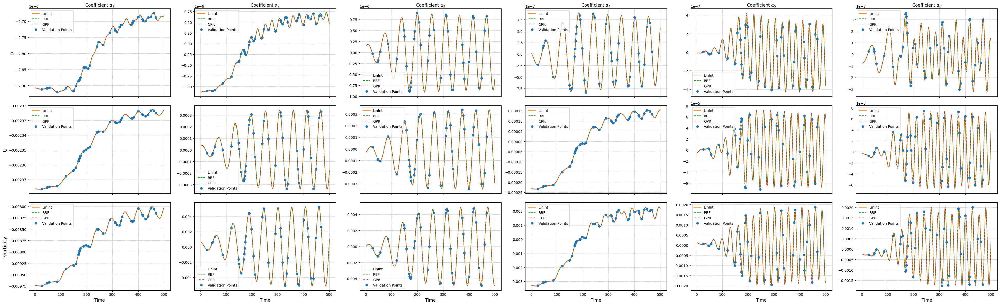

In [29]:
ncols = 6
nrows = len(var_names)

_fine_time = np.linspace(min(times), max(times), 300)

fig, axs = plt.subplots(nrows, ncols, figsize=(6.5 * ncols, 4 * nrows), sharex=True)

for ii, field in enumerate(var_names):

    # Linear Interpolation
    lin_pred = surr_models['LinInt'][field].predict(_fine_time)

    # RBF Interpolation
    rbf_pred = surr_models['RBF'][field].predict(_fine_time)

    # GPR
    gpr_pred = surr_models['GPR'][field].predict(_fine_time)
    gpr_std  = surr_models['GPR'][field].predict_std(_fine_time)

    for jj in range(ncols):
        axs[ii, jj].plot(_fine_time, lin_pred[jj], '-', label='LinInt', color='C1')
        axs[ii, jj].plot(_fine_time, rbf_pred[jj], '--', label='RBF', color='C2')
        axs[ii, jj].plot(_fine_time, gpr_pred[jj], ':', label='GPR', color='C3')
        axs[ii, jj].fill_between(   _fine_time, 
                                    gpr_pred[jj] - 1.96 * gpr_std[jj],
                                    gpr_pred[jj] + 1.96 * gpr_std[jj],
                                    color='C3', alpha=0.3)
        
        axs[ii, jj].plot(train_times[valid_idx], pod_coeffs[field][jj, valid_idx], 'o', label='Validation Points', color='C0')

        axs[ii, jj].grid(which='both', linestyle='--', linewidth=0.5)
        axs[ii, jj].legend(fontsize=10)

        if ii == 0:
            axs[ii, jj].set_title(r'Coefficient $\alpha_{' + str(jj+1) + '}$', fontsize=12)

        if ii + 1 == nrows:
            axs[ii, jj].set_xlabel('Time', fontsize=12)

    axs[ii, 0].set_ylabel(f'{field}', fontsize=14)

plt.tight_layout()

## Online Phase
The online phase is responsible for the evaluation of the reduced model at unseen parameters. In this notebook, we will focus on the time parameter only, but the same approach can be extended to other parameters as well. The online phase involves the computation of the reduced coefficients $\alpha_i(\mu)$ for new parameter values, which can be done using interpolation or regression techniques, hence approximating the mapping $\mu \mapsto \alpha_i(\mu)$ by learning a function $\mathcal{F}_i$ such that $\alpha_i(\mu) \approx \mathcal{F}_i(\mu)$.

This algorithm is known within the ROM community as a non-intrusive ROM, as it does not require the governing equations to generate a model for the latent space, being so fully data-driven. The idea is based on the POD with Interpolation (POD-I) by Demo et al. (2018).

The *pyforce* package implements this online phase within the library `pyforce.online.pod`: this contains a class `POD` that can use the reduced basis, obtained by either the randomised SVD or the POD, and the surrogate model for the latent space to reconstruct the full-order solution for new parameter values. It has been chosen not to implement a separate class for the SVD, as the only difference is in the computation of the reduced basis, while the reconstruction is the same for both techniques: based on the linear combination of the basis functions and the coefficients from the surrogate model.

The class is initialisation with the grid (`pv.UnstructuredGrid`) and optionally the variable name and the dimension of the problem (2D or 3D). 

In [30]:
from pyforce.online.pod import POD as OnlinePOD

online_pod =    {
                    field: OnlinePOD(grid, varname=field) for field in var_names
                }

The basis can be loaded using the `load_basis` method: two possibilities are available, either loading the basis from a folder where the results of the offline phase were saved using the `save` method, or providing directly the `FunctionsList` object containing the modes.

In [31]:
for field in var_names:
    online_pod[field].set_basis(basis = pod[field].pod_modes)
    # or load from folder where offline results were saved
    # online_pod[field].set_basis(path_folder = 'Results/01/OfflinePOD/')

The state of the system can be reconstructed using the `estimate` method, providing the surrogate model for the latent space and the new parameter values (time instances in this case).

In [32]:
state_estimate = dict()

for field in var_names:
    state_estimate[field] = dict()

    for _meth in surr_models.keys():
        state_estimate[field][_meth] = online_pod[field].estimate(surr_models[_meth][field], test_times)

Let us compare the reconstructed fields with the original ones for a given time instance in the test set.

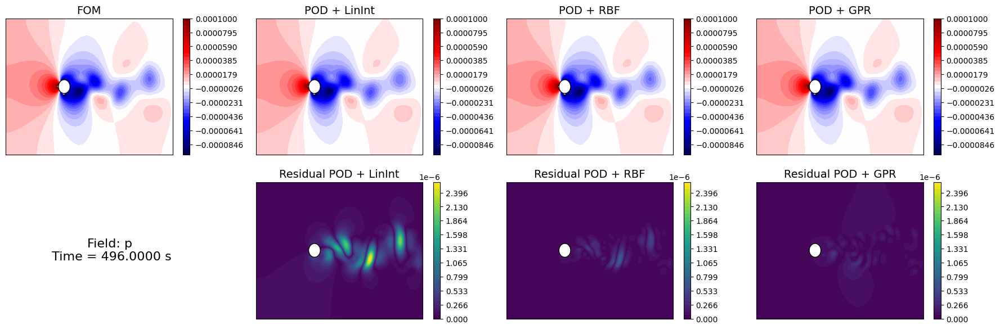

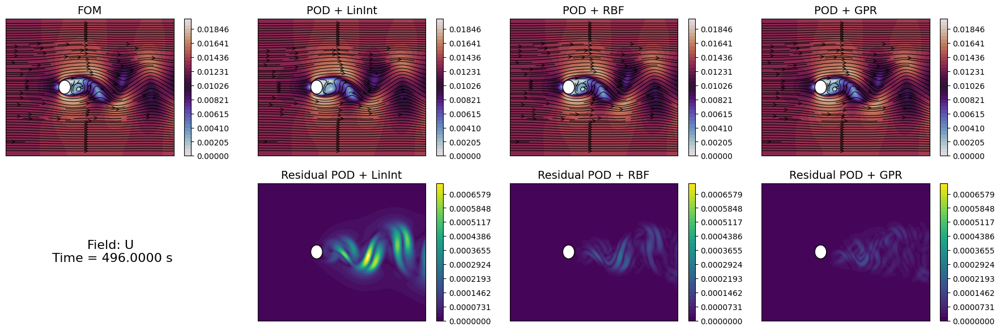

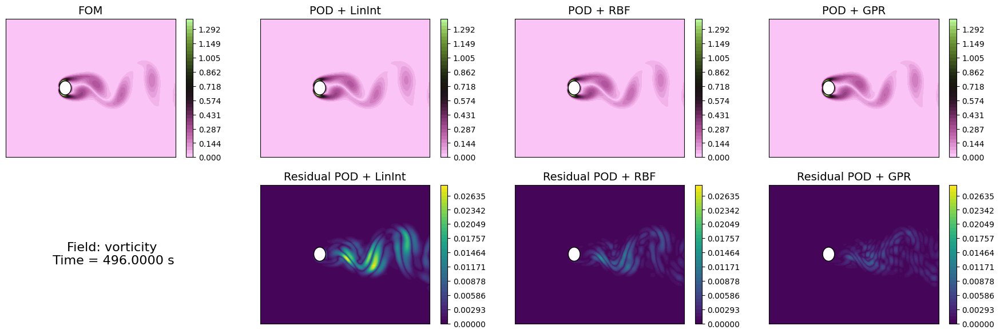

In [33]:
levels = {
    'p': np.linspace(-1e-4, 1e-4, 40),
    'U': np.linspace(0, 0.02, 40),
    'vorticity': np.linspace(0, 1.4, 40)
}

idx_time_to_plot = -1

for field in var_names:

    fig, axs = plt.subplots(2, 1 + len(surr_models), figsize=(5.5 * (1 + len(surr_models)), 5 * plotter.aspect * 2))


    # FOM
    c = plotter.plot_contour(axs[0,0], test_datasets[field](idx_time_to_plot), 
                            cmap=cmaps[field], levels=levels[field],
                            streamline_plot=True if field=='U' else False)
    fig.colorbar(c, ax=axs[0,0])
    axs[0,0].set_title('FOM', fontsize=14)

    # POD-I
    resids = list()
    for jj, _meth in enumerate(surr_models.keys()):
        c = plotter.plot_contour(axs[0,jj+1], state_estimate[field][_meth](idx_time_to_plot), 
                                cmap=cmaps[field], levels=levels[field],
                                streamline_plot=True if field=='U' else False)
        fig.colorbar(c, ax=axs[0,jj+1])
        axs[0,jj+1].set_title(f'POD + {_meth}', fontsize=14)

        resids.append( np.abs(test_datasets[field](idx_time_to_plot) - state_estimate[field][_meth](idx_time_to_plot)) )

    # Residuals
    res_levels = np.linspace(0, max([np.max(r) for r in resids]), 40)
    for jj, _meth in enumerate(surr_models.keys()):
        c = plotter.plot_contour(axs[1,jj+1], resids[jj], 
                                cmap=cm.viridis, levels=res_levels,
                                streamline_plot=False)
        fig.colorbar(c, ax=axs[1,jj+1])
        axs[1,jj+1].set_title(f'Residual POD + {_meth}', fontsize=14)


    axs[1,0].axis('off')

    # Time info
    time_info = f'Field: {field}\n Time = {test_times[idx_time_to_plot]:.4f} s'
    axs[1,0].text(0.5, 0.5, time_info, fontsize=16, ha='center', va='center')

Similarly to the projection error, we can compute the reconstruction error for the test set using the `compute_errors` method of the `POD` class, which returns a `NamedTuple` containing the absolute and relative errors for each field and the computational costs.

In [ ]:
test_res = dict()

for field in var_names:
    test_res[field] = dict()
    for _meth in surr_models.keys():
        test_res[field][_meth] = online_pod[field].compute_errors(test_datasets[field],
                                                                    coeff_model = surr_models[_meth][field], 
                                                                    input_vector = test_times,
                                                                    verbose=True # optional
                                                                    )

Let's make a plot of the errors and the computational times.

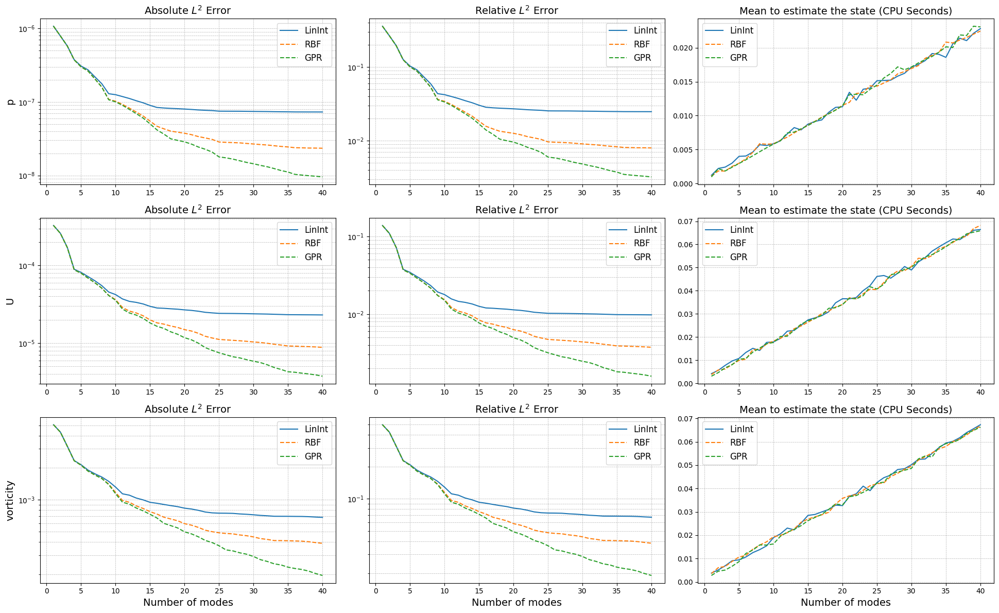

In [35]:
fig, axs = plt.subplots(len(var_names), 3, figsize=(6.5 * 3, 4 * len(var_names)))

N_plot = np.arange(1, max_test_rank + 1)

for ii, field in enumerate(var_names):
    for jj, _meth in enumerate(surr_models.keys()):
        axs[ii,0].semilogy(N_plot, test_res[field][_meth][0], '-' if jj==0 else '--', label=_meth)
        axs[ii,1].semilogy(N_plot, test_res[field][_meth][1], '-' if jj==0 else '--', label=_meth)
        axs[ii,2].plot(N_plot, test_res[field][_meth][2]['StateEstimation'].mean(axis=0), '-' if jj==0 else '--', label=_meth)
        axs[ii,2].fill_between(N_plot, 
                              test_res[field][_meth][2]['StateEstimation'].mean(axis=0) - 1.96 * test_res[field][_meth][2]['StateEstimation'].std(axis=0),
                              test_res[field][_meth][2]['StateEstimation'].mean(axis=0) + 1.96 * test_res[field][_meth][2]['StateEstimation'].std(axis=0),
                              alpha=0.3)
        
    axs[ii,0].set_title('Absolute $L^2$ Error', fontsize=14)
    axs[ii,1].set_title('Relative $L^2$ Error', fontsize=14)
    axs[ii,2].set_title('Mean to estimate the state (CPU Seconds)', fontsize=14)

    axs[ii,0].set_ylabel(f'{field}', fontsize=14)
    for ax in axs[ii]:
        ax.legend(fontsize=12)
        ax.grid(which='both', linestyle='--', linewidth=0.5)

for ax in axs[-1]:
    ax.set_xlabel('Number of modes', fontsize=14)

plt.tight_layout()